In [1]:
from matplotlib import pyplot as plt
import numpy as np
import os
import tensorflow as tf
import tensorflow.contrib.slim as slim

import urllib.request as urllib2

from tensorflow.contrib.slim.python.slim.nets import vgg
import vgg_preprocessing
import imagenet

#import imagenet
checkpoints_dir = './'

In [2]:
# We need default size of image for a particular network.
# The network was trained on images of that size -- so we
# resize input image later in the code.
image_size = vgg.vgg_16.default_image_size


In [69]:
url = ("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSbsA58gCUWWDmZ6Yfp-HtgAdMplhVFBAoQR7SCxQq0cNqN0EMq")
# Open specified url and load image as a string
image_string = urllib2.urlopen(url).read()
# Decode string into matrix with intensity values
image = tf.image.decode_jpeg(image_string, channels=3)

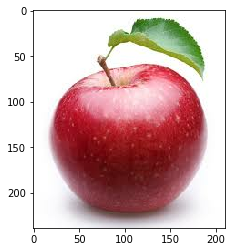

In [70]:
with tf.Session() as sess:
    np_image = sess.run(image)

plt.imshow(np_image.astype(np.uint8))

In [71]:
def mask(image, pos_x, pos_y, size):
    new = image.copy()
    new[pos_x : pos_x + size, pos_y : pos_y + size, :].fill(125)
    return new.astype(np.uint8)        

In [72]:
def generate_masks(image, stride_coef, size):
    generated = []
    for m_x in range(0, image.shape[0] - stride_coef * size, stride_coef * size):
        for m_y in range(0, image.shape[1] - stride_coef * size, stride_coef * size):
            generated.append((m_x, m_y, size))
    return np.array(generated)

In [103]:
def how_many_masks(image, stride_coef, size):
    return np.array([(image.shape[0]) / (stride_coef * size), (image.shape[1]) / (stride_coef * size)], dtype=np.uint8)

In [94]:
generate_masks(np_image.copy(), 1, 20).shape

(110, 3)

In [74]:
generate_masks(np_image.copy(), 1, 20)

array([[  0,   0,  20],
       [  0,  20,  20],
       [  0,  40,  20],
       [  0,  60,  20],
       [  0,  80,  20],
       [  0, 100,  20],
       [  0, 120,  20],
       [  0, 140,  20],
       [  0, 160,  20],
       [  0, 180,  20],
       [ 20,   0,  20],
       [ 20,  20,  20],
       [ 20,  40,  20],
       [ 20,  60,  20],
       [ 20,  80,  20],
       [ 20, 100,  20],
       [ 20, 120,  20],
       [ 20, 140,  20],
       [ 20, 160,  20],
       [ 20, 180,  20],
       [ 40,   0,  20],
       [ 40,  20,  20],
       [ 40,  40,  20],
       [ 40,  60,  20],
       [ 40,  80,  20],
       [ 40, 100,  20],
       [ 40, 120,  20],
       [ 40, 140,  20],
       [ 40, 160,  20],
       [ 40, 180,  20],
       [ 60,   0,  20],
       [ 60,  20,  20],
       [ 60,  40,  20],
       [ 60,  60,  20],
       [ 60,  80,  20],
       [ 60, 100,  20],
       [ 60, 120,  20],
       [ 60, 140,  20],
       [ 60, 160,  20],
       [ 60, 180,  20],
       [ 80,   0,  20],
       [ 80,  20

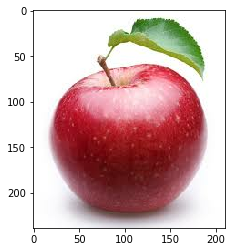

In [75]:
plt.imshow(np_image)
plt.show()

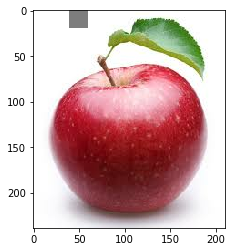

In [76]:
gm = generate_masks(np_image.copy(), 1, 20)[2]
plt.imshow(mask(np_image, *gm))
plt.show()

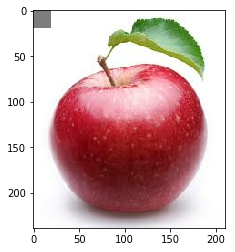

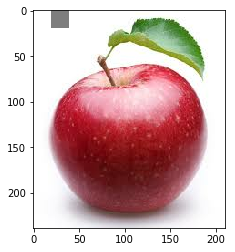

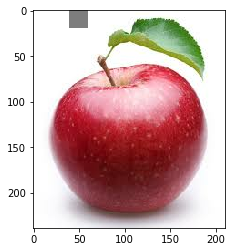

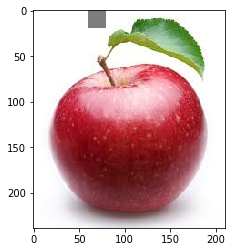

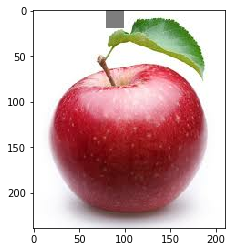

...

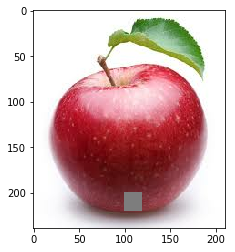

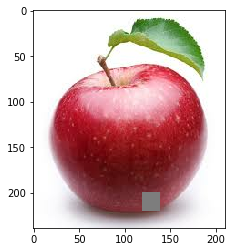

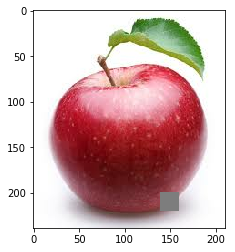

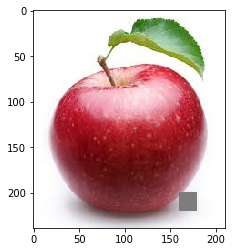

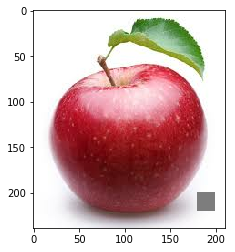

In [77]:
for i in generate_masks(np_image, 1, 20):
    plt.imshow(mask(np_image, *i))
    plt.show()

INFO:tensorflow:Restoring parameters from ./vgg_16.ckpt


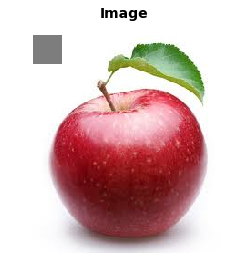

Probability 0.81 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.03 => [hip, rose hip, rosehip]
Probability 0.03 => [strawberry]
Probability 0.01 => [fig]


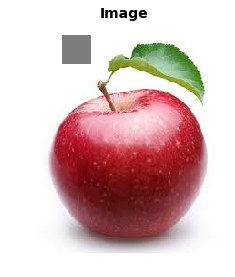

Probability 0.79 => [Granny Smith]
Probability 0.08 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.03 => [hip, rose hip, rosehip]
Probability 0.01 => [fig]


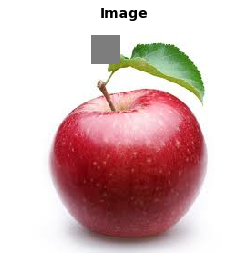

Probability 0.81 => [Granny Smith]
Probability 0.08 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.03 => [hip, rose hip, rosehip]
Probability 0.01 => [orange]


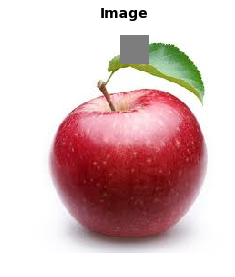

Probability 0.78 => [Granny Smith]
Probability 0.09 => [pomegranate]
Probability 0.04 => [strawberry]
Probability 0.03 => [hip, rose hip, rosehip]
Probability 0.01 => [fig]


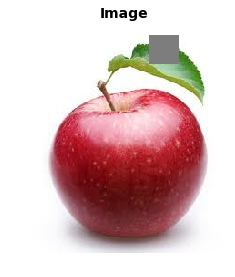

Probability 0.78 => [Granny Smith]
Probability 0.10 => [pomegranate]
Probability 0.04 => [hip, rose hip, rosehip]
Probability 0.03 => [strawberry]
Probability 0.01 => [fig]


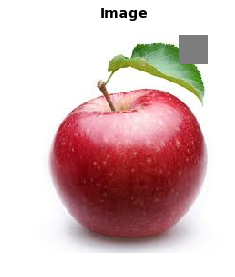

Probability 0.67 => [Granny Smith]
Probability 0.15 => [pomegranate]
Probability 0.07 => [hip, rose hip, rosehip]
Probability 0.05 => [strawberry]
Probability 0.01 => [fig]


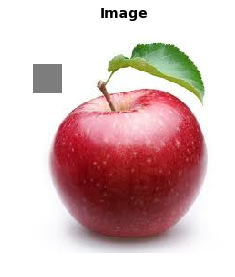

Probability 0.85 => [Granny Smith]
Probability 0.06 => [pomegranate]
Probability 0.02 => [hip, rose hip, rosehip]
Probability 0.02 => [strawberry]
Probability 0.01 => [fig]


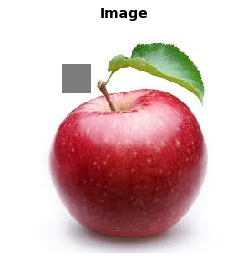

Probability 0.86 => [Granny Smith]
Probability 0.05 => [pomegranate]
Probability 0.02 => [strawberry]
Probability 0.02 => [hip, rose hip, rosehip]
Probability 0.01 => [fig]


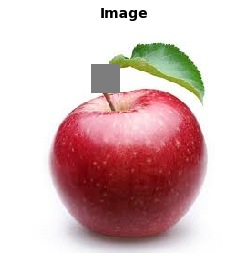

Probability 0.78 => [Granny Smith]
Probability 0.10 => [pomegranate]
Probability 0.02 => [strawberry]
Probability 0.01 => [lipstick, lip rouge]
Probability 0.01 => [hip, rose hip, rosehip]


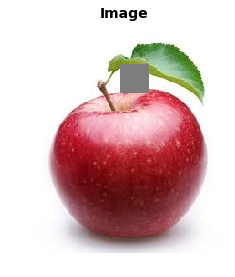

Probability 0.77 => [Granny Smith]
Probability 0.11 => [pomegranate]
Probability 0.02 => [hip, rose hip, rosehip]
Probability 0.02 => [strawberry]
Probability 0.01 => [vase]


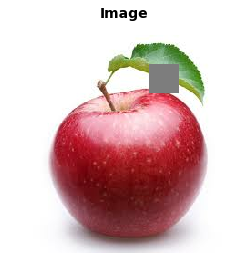

Probability 0.64 => [Granny Smith]
Probability 0.16 => [pomegranate]
Probability 0.05 => [hip, rose hip, rosehip]
Probability 0.02 => [lipstick, lip rouge]
Probability 0.02 => [strawberry]


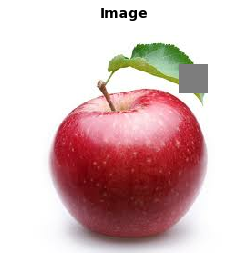

Probability 0.53 => [Granny Smith]
Probability 0.27 => [pomegranate]
Probability 0.11 => [hip, rose hip, rosehip]
Probability 0.02 => [strawberry]
Probability 0.01 => [fig]


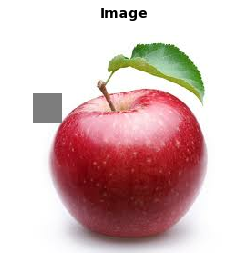

Probability 0.90 => [Granny Smith]
Probability 0.04 => [pomegranate]
Probability 0.01 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.00 => [fig]


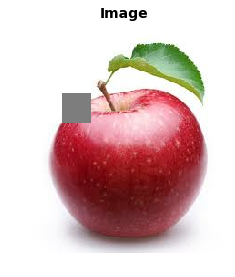

Probability 0.83 => [Granny Smith]
Probability 0.07 => [strawberry]
Probability 0.03 => [pomegranate]
Probability 0.01 => [lipstick, lip rouge]
Probability 0.01 => [fig]


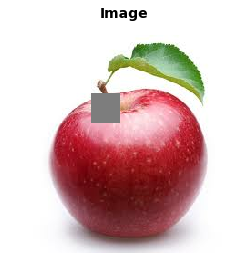

Probability 0.79 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.01 => [lipstick, lip rouge]
Probability 0.01 => [vase]


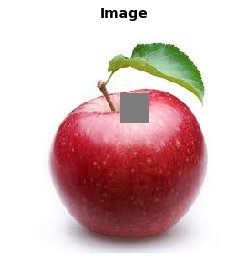

Probability 0.80 => [Granny Smith]
Probability 0.05 => [pomegranate]
Probability 0.02 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [perfume, essence]


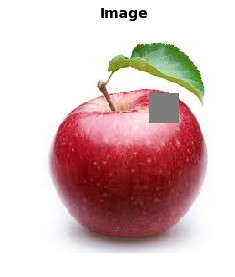

Probability 0.61 => [Granny Smith]
Probability 0.16 => [pomegranate]
Probability 0.05 => [hip, rose hip, rosehip]
Probability 0.04 => [strawberry]
Probability 0.02 => [vase]


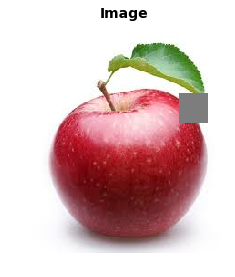

Probability 0.64 => [Granny Smith]
Probability 0.14 => [pomegranate]
Probability 0.08 => [strawberry]
Probability 0.06 => [hip, rose hip, rosehip]
Probability 0.02 => [fig]


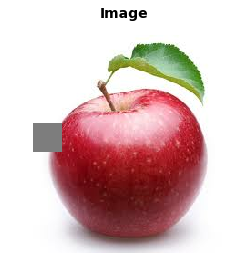

Probability 0.84 => [Granny Smith]
Probability 0.06 => [pomegranate]
Probability 0.04 => [strawberry]
Probability 0.02 => [hip, rose hip, rosehip]
Probability 0.01 => [orange]


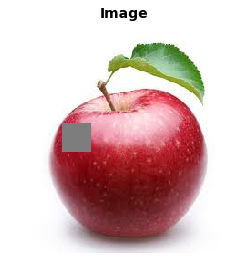

Probability 0.90 => [Granny Smith]
Probability 0.04 => [pomegranate]
Probability 0.01 => [maraca]
Probability 0.01 => [strawberry]
Probability 0.01 => [croquet ball]


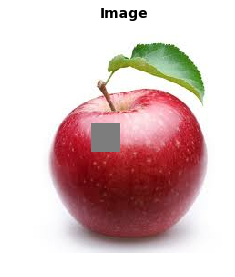

Probability 0.78 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.04 => [strawberry]
Probability 0.01 => [lipstick, lip rouge]
Probability 0.01 => [orange]


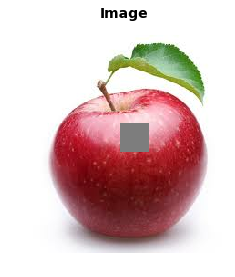

Probability 0.72 => [Granny Smith]
Probability 0.10 => [pomegranate]
Probability 0.03 => [piggy bank, penny bank]
Probability 0.02 => [lipstick, lip rouge]
Probability 0.02 => [strawberry]


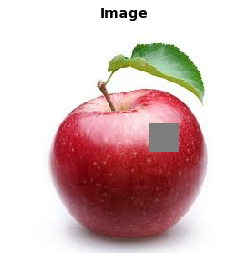

Probability 0.76 => [Granny Smith]
Probability 0.09 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.01 => [lipstick, lip rouge]
Probability 0.01 => [orange]


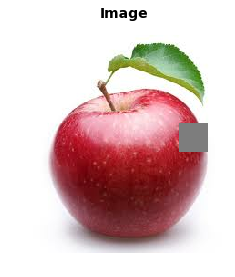

Probability 0.89 => [Granny Smith]
Probability 0.03 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.01 => [bell pepper]
Probability 0.01 => [hip, rose hip, rosehip]


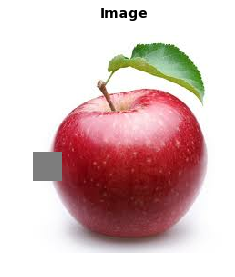

Probability 0.86 => [Granny Smith]
Probability 0.05 => [pomegranate]
Probability 0.02 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [lipstick, lip rouge]


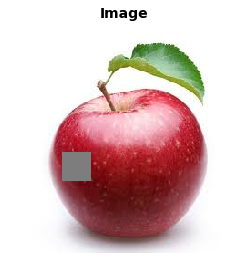

Probability 0.84 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.01 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [vase]


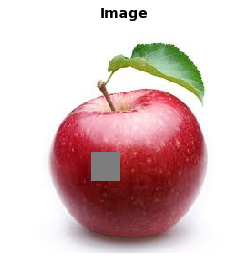

Probability 0.82 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.02 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [red wine]


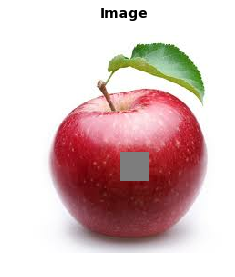

Probability 0.84 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.01 => [strawberry]
Probability 0.01 => [red wine]
Probability 0.01 => [perfume, essence]


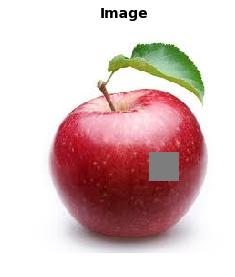

Probability 0.81 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.01 => [orange]
Probability 0.01 => [hip, rose hip, rosehip]


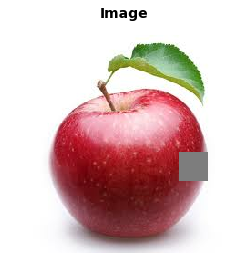

Probability 0.82 => [Granny Smith]
Probability 0.06 => [pomegranate]
Probability 0.05 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [bell pepper]


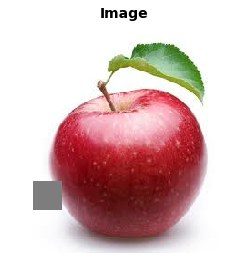

Probability 0.83 => [Granny Smith]
Probability 0.05 => [pomegranate]
Probability 0.05 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [lipstick, lip rouge]


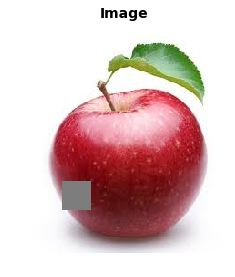

Probability 0.81 => [Granny Smith]
Probability 0.06 => [pomegranate]
Probability 0.05 => [strawberry]
Probability 0.02 => [lipstick, lip rouge]
Probability 0.01 => [hip, rose hip, rosehip]


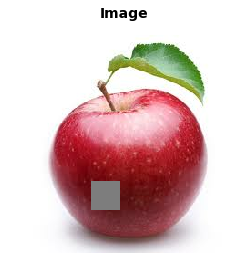

Probability 0.82 => [Granny Smith]
Probability 0.08 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [orange]


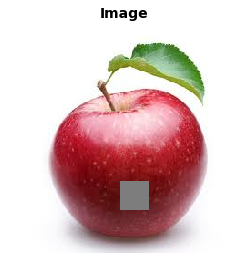

Probability 0.84 => [Granny Smith]
Probability 0.06 => [pomegranate]
Probability 0.04 => [strawberry]
Probability 0.01 => [orange]
Probability 0.01 => [hip, rose hip, rosehip]


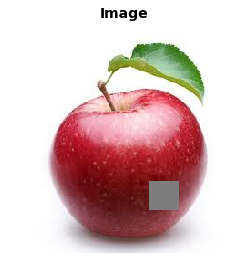

Probability 0.80 => [Granny Smith]
Probability 0.06 => [strawberry]
Probability 0.06 => [pomegranate]
Probability 0.01 => [orange]
Probability 0.01 => [hip, rose hip, rosehip]


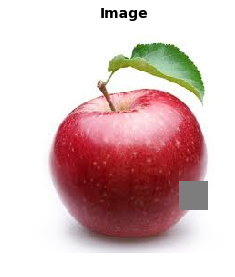

Probability 0.80 => [Granny Smith]
Probability 0.09 => [strawberry]
Probability 0.04 => [pomegranate]
Probability 0.01 => [orange]
Probability 0.01 => [hip, rose hip, rosehip]


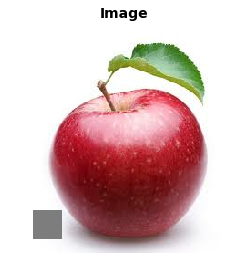

Probability 0.85 => [Granny Smith]
Probability 0.06 => [pomegranate]
Probability 0.03 => [strawberry]
Probability 0.02 => [hip, rose hip, rosehip]
Probability 0.01 => [vase]


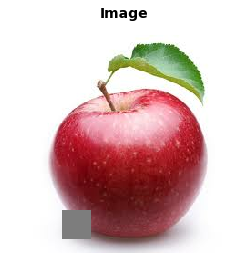

Probability 0.75 => [Granny Smith]
Probability 0.07 => [strawberry]
Probability 0.07 => [pomegranate]
Probability 0.03 => [hip, rose hip, rosehip]
Probability 0.02 => [lipstick, lip rouge]


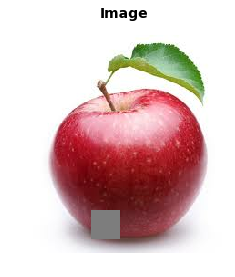

Probability 0.72 => [Granny Smith]
Probability 0.11 => [pomegranate]
Probability 0.05 => [strawberry]
Probability 0.04 => [hip, rose hip, rosehip]
Probability 0.01 => [fig]


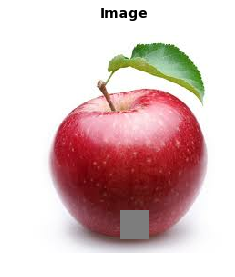

Probability 0.82 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.05 => [strawberry]
Probability 0.02 => [hip, rose hip, rosehip]
Probability 0.01 => [fig]


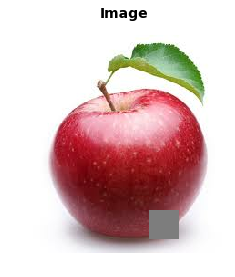

Probability 0.76 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.05 => [strawberry]
Probability 0.03 => [hip, rose hip, rosehip]
Probability 0.01 => [vase]


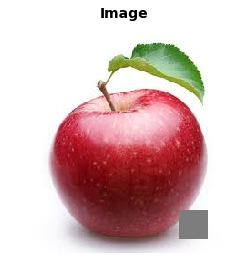

Probability 0.83 => [Granny Smith]
Probability 0.07 => [pomegranate]
Probability 0.04 => [strawberry]
Probability 0.01 => [hip, rose hip, rosehip]
Probability 0.01 => [orange]


In [86]:
with tf.Graph().as_default():
    
    image_ = tf.placeholder(tf.float32, shape=(None, None, 3))
    # Resize the input image, preserving the aspect ratio
    # and make a central crop of the resulted image.
    # The crop will be of the size of the default image size of
    # the network.
    processed_image = vgg_preprocessing.preprocess_image(image_,
                                                         image_size,
                                                         image_size,
                                                         is_training=False)

    # Networks accept images in batches.
    # The first dimension usually represents the batch size.
    # In our case the batch size is one.
    processed_images = tf.expand_dims(processed_image, 0)

    # Create the model, use the default arg scope to configure
    # the batch norm parameters. arg_scope is a very conveniet
    # feature of slim library -- you can define default
    # parameters for layers -- like stride, padding etc.
    with slim.arg_scope(vgg.vgg_arg_scope()):
        logits, _ = vgg.vgg_16(processed_images,
                               num_classes=1000,
                               is_training=False)

    # In order to get probabilities we apply softmax on the output.
    probabilities = tf.nn.softmax(logits)

    # Create a function that reads the network weights
    # from the checkpoint file that you downloaded.
    # We will run it in session later.
    init_fn = slim.assign_from_checkpoint_fn(
        os.path.join(checkpoints_dir, 'vgg_16.ckpt'),
        slim.get_model_variables('vgg_16'))

#     with tf.Session() as sess:
#         # Load weights
#         init_fn(sess)

#         # We want to get predictions, image as numpy matrix
#         # and resized and cropped piece that is actually
#         # being fed to the network.
#         np_image, network_input, probabilities = sess.run([image_,
#                                                            processed_image,
#                                                            probabilities], feed_dict = { image_: np_image })
#         probabilities = probabilities[0, 0:]
#         sorted_inds = [i[0] for i in sorted(enumerate(-probabilities),
#                                             key=lambda x: x[1])]

    with tf.Session() as sess:
        # Load weights
        init_fn(sess)

        # We want to get predictions, image as numpy matrix
        # and resized and cropped piece that is actually
        # being fed to the network.
        heatmap = []
        for i in generate_masks(np_image, 1, 32):
            img, network_input, probabilities_new = sess.run([image_,
                                                               processed_image,
                                                               probabilities], 
                                                               feed_dict = { image_: mask(np_image.copy(), *i) })
            probabilities_new = probabilities_new[0, 0:]
            sorted_inds = [i[0] for i in sorted(enumerate(-probabilities_new),
                                                key=lambda x: x[1])]
            
            
            
            heatmap.append([probabilities_new[sorted_inds[i]] for i in range(5)])
            # Show the downloaded image
            plt.figure()
            plt.imshow(img.astype(np.uint8))
            plt.suptitle("Image", fontsize=14, fontweight='bold')
            plt.axis('off')
            plt.show()

            # Show the image that is actually being fed to the network
            # The image was resized while preserving aspect ratio and then
            # cropped. After that, the mean pixel value was subtracted from
            # each pixel of that crop. We normalize the image to be between [-1, 1]
            # to show the image.

            names = imagenet.create_readable_names_for_imagenet_labels()
            for i in range(5):
                index = sorted_inds[i]
                # Now we print the top-5 predictions that the network gives us with
                # corresponding probabilities. Pay attention that the index with
                # class names is shifted by 1 -- this is because some networks
                # were trained on 1000 classes and others on 1001. VGG-16 was trained
                # on 1000 classes.
                print('Probability %0.2f => [%s]' % (probabilities_new[index], names[index + 1]))

            res = slim.get_model_variables()

In [113]:
heatmap_reshaped = np.array(heatmap).reshape(*how_many_masks(np_image, 1, 32), -1)

In [114]:
np.array(heatmap_reshaped).shape

(7, 6, 5)

In [115]:
heatmap_reshaped

array([[[0.81038266, 0.07386387, 0.03277468, 0.03101227, 0.00832693],
        [0.79335505, 0.08471667, 0.03409528, 0.03064971, 0.00760647],
        [0.807685  , 0.08094088, 0.03212726, 0.0299125 , 0.0063465 ],
        [0.7844027 , 0.09046955, 0.03976849, 0.0320697 , 0.00885043],
        [0.77572584, 0.1002327 , 0.0378757 , 0.03382181, 0.00904997],
        [0.66732776, 0.14834379, 0.06729354, 0.05125671, 0.01123282]],

       [[0.8539027 , 0.05772906, 0.02402951, 0.02297438, 0.00586273],
        [0.86265504, 0.05263198, 0.02477558, 0.01573808, 0.00721224],
        [0.7807056 , 0.09569278, 0.0233282 , 0.01493841, 0.01045125],
        [0.7673044 , 0.10580771, 0.02464878, 0.02076396, 0.00851664],
        [0.63775337, 0.15988706, 0.05493614, 0.01908057, 0.01761354],
        [0.5256421 , 0.26691622, 0.112827  , 0.01899604, 0.01086739]],

       [[0.8950078 , 0.04086088, 0.01497928, 0.0108095 , 0.00466204],
        [0.8321649 , 0.06787972, 0.02645989, 0.01423545, 0.00966986],
        [0.79412